# Towards Cellular-Level Alignment: A Coarse-to-Fine Approach for Multistain Whole Slide Image Registration

This notebook demonstrates the complete workflow for Whole Slide Image (WSI) registration using rigid and non-rigid techniques with nuclei-based analysis.

## Overview
- **Prompt-based Tissue mask extraction**:Prompt based tissue mask segmentation
- **Coarse Registration**: Initial coarse alignment using traditional techniques
- **Nuclei Detection**: Extract nuclei from tissue patches
- **Fine Shape-aware Nuclei based Registration**: Point cloud-based fine alignment and coherent Point Drift (CPD) for local deformation
- **Interactive Visualization**: Bokeh plots for analysis


## 1. Setup and Imports

In [1]:
import sys
import os

# Add project root to PYTHONPATH
project_root = os.path.abspath(os.path.join(os.getcwd(), ".."))  # adjust if needed
if project_root not in sys.path:
    sys.path.insert(0, project_root)


In [2]:

%matplotlib inline
%load_ext autoreload
%autoreload 2
import SimpleITK as sitk
import numpy as np
from matplotlib import pyplot as plt

from wsi_mif_registration.utils.imports import *
from wsi_mif_registration.config import *
from wsi_mif_registration.preprocessing.padding import *
from wsi_mif_registration.preprocessing.preprocessing import *
from wsi_mif_registration.registration.registration import *
from wsi_mif_registration.evaluation.evaluation import *
from wsi_mif_registration.visualization.visualization import *
from wsi_mif_registration.preprocessing.nuclei_analysis import *
from wsi_mif_registration.preprocessing.stainnorm import *
from wsi_mif_registration.registration.nonrigid import *
from wsi_mif_registration.cpd import *


# Setup Bokeh for notebook output
setup_bokeh_notebook()

print("✅ All modules imported successfully!")
print(f"Source WSI: {SOURCE_WSI_PATH}")
print(f"Target WSI: {TARGET_WSI_PATH}")

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


|2025-07-10|12:33:14.003| [WARNING] /home/u5552013/miniconda3/envs/tiatoolbox-reg-vis/lib/python3.9/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.8 (you have 1.4.21). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()



Loading BokehJS ...

✅ All modules imported successfully!
Source WSI: /home/u5552013/Nextcloud/ANHIR/COAD_02/scale-25pc/S2.jpg
Target WSI: /home/u5552013/Nextcloud/ANHIR/COAD_02/scale-25pc/S5.jpg


## 2. Configuration Check

Verify that all file paths are correct and files exist.

In [3]:
import os

# Check if files exist
files_to_check = [
    SOURCE_WSI_PATH,
    TARGET_WSI_PATH,
    FIXED_POINTS_PATH,
    MOVING_POINTS_PATH
]

print("File existence check:")
for file_path in files_to_check:
    exists = os.path.exists(file_path)
    status = "✅" if exists else "❌"
    print(f"{status} {file_path}")

# Display current parameters
print("\nCurrent Parameters:")
print(f"- Preprocessing Resolution: {PREPROCESSING_RESOLUTION}")
print(f"- Registration Resolution: {REGISTRATION_RESOLUTION}")
print(f"- Patch Size: {PATCH_SIZE}")
print(f"- Fixed Threshold: {FIXED_THRESHOLD}")
print(f"- Moving Threshold: {MOVING_THRESHOLD}")
print(f"- Min Nuclei Area: {MIN_NUCLEI_AREA}")

File existence check:
✅ /home/u5552013/Nextcloud/ANHIR/COAD_02/scale-25pc/S2.jpg
✅ /home/u5552013/Nextcloud/ANHIR/COAD_02/scale-25pc/S5.jpg
✅ /home/u5552013/Nextcloud/HYRECO/Eval/he_533.csv
✅ /home/u5552013/Nextcloud/HYRECO/Eval/ki67_533.csv

Current Parameters:
- Preprocessing Resolution: 0.625
- Registration Resolution: 40
- Patch Size: (1000, 1000)
- Fixed Threshold: 100
- Moving Threshold: 50
- Min Nuclei Area: 200


## 3. Load and Preprocess WSIs

In [4]:
# Load WSI images
print("Loading WSI images...")
source_wsi, target_wsi, source, target = load_wsi_images(
    SOURCE_WSI_PATH, TARGET_WSI_PATH, PREPROCESSING_RESOLUTION, data='anhir'
)

print(f"\nLoaded images:")
print(f"Source shape: {source.shape}")
print(f"Target shape: {target.shape}")

|2025-07-10|12:33:24.416| [ERROR] File does not have a .json extension.


Loading WSI images...


|2025-07-10|12:33:25.553| [ERROR] File does not have a .json extension.
|2025-07-10|12:33:26.443| [WARNING] Raw data is None.
|2025-07-10|12:33:26.444| [WARNING] Unknown scale (no objective_power or mpp)
|2025-07-10|12:33:26.444| [WARNING] Raw data is None.
|2025-07-10|12:33:26.445| [WARNING] Unknown scale (no objective_power or mpp)



Loaded images:
Source shape: (597, 541, 3)
Target shape: (608, 524, 3)


In [5]:
# Preprocess images
print("Preprocessing images...")
# source_prep,target_prep=source,target
source_prep, target_prep,padding_params =pad_images(source, target)

# Extract tissue masks
print("Extracting tissue masks...")
source_mask, target_mask = extract_tissue_masks(source_prep, target_prep, artefacts=False)

print("✅ Preprocessing completed!")

Preprocessing images...
Extracting tissue masks...
✅ Preprocessing completed!


# 4. Visualize Image and Tissue Masks

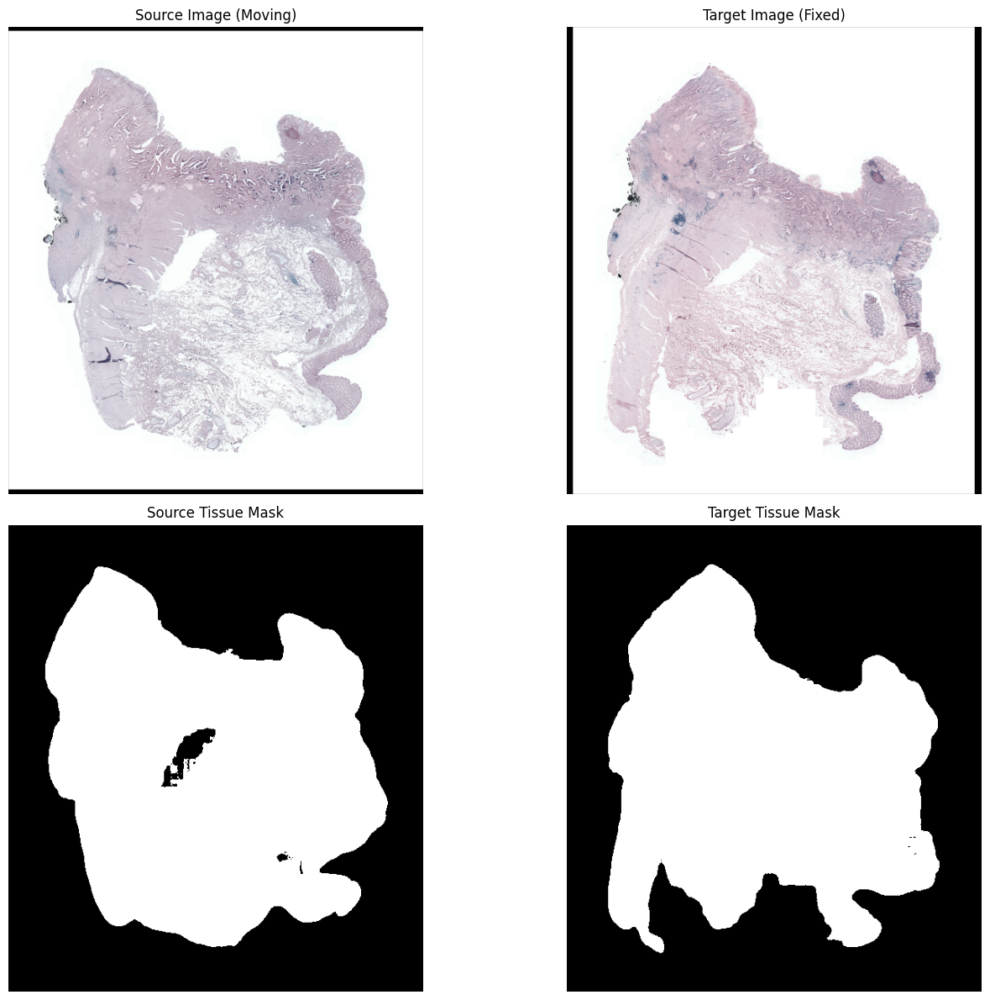

In [6]:
# Display original images side by side
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

axes[0, 0].imshow(source_prep)
axes[0, 0].set_title('Source Image (Moving)')
axes[0, 0].axis('off')

axes[0, 1].imshow(target_prep)
axes[0, 1].set_title('Target Image (Fixed)')
axes[0, 1].axis('off')

axes[1, 0].imshow(source_mask, cmap='gray')
axes[1, 0].set_title('Source Tissue Mask')
axes[1, 0].axis('off')

axes[1, 1].imshow(target_mask, cmap='gray')
axes[1, 1].set_title('Target Tissue Mask')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

## 5. Coarse Registration

|2025-07-10|12:33:44.231| [WARNING] /home/u5552013/Desktop/WSI_mIF_Registration/accelerated_features/modules/xfeat.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.

Performing rigid registration...
ngf 0.06608350056146174
loading weights from: /home/u5552013/Desktop/WSI_mIF_Registration/accelerated_features/modules/../weights/xfeat.pt
ngf 0.06284312712624314
ngf 0.06719799908990795


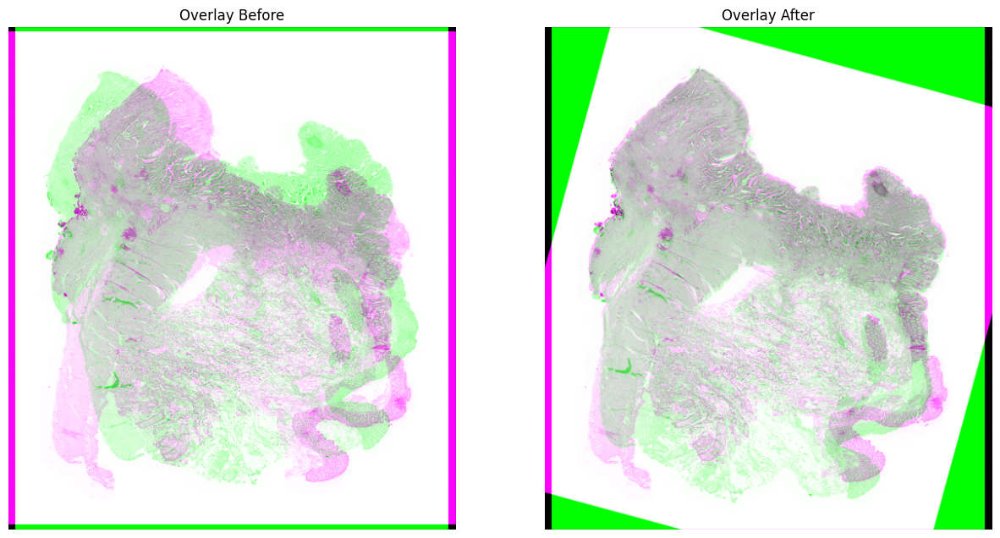

In [7]:
# Perform rigid registration
print("Performing rigid registration...")
moving_img_transformed, final_transform = perform_rigid_registration(
    source_prep, target_prep, source_mask, target_mask
)
visualize_overlays(target_prep, source_prep, moving_img_transformed)


|2025-07-10|12:33:54.406| [INFO] Using device: cuda


|2025-07-10|12:33:54.410| [WARNING] /home/u5552013/Desktop/WSI_mIF_Registration/wsi_mif_registration/registration/nonrigid.py:272: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  source_tensor = t.tensor(tensor_source, dtype=t.float32, requires_grad=True).to(compute_device)

|2025-07-10|12:33:54.411| [WARNING] /home/u5552013/Desktop/WSI_mIF_Registration/wsi_mif_registration/registration/nonrigid.py:273: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  target_tensor = t.tensor(tensor_target, dtype=t.float32, requires_grad=True).to(compute_device)



|2025-07-10|12:33:54.421| [INFO] Moving image tensor size: torch.Size([1, 1, 608, 541])
|2025-07-10|12:33:54.422| [INFO] Creating 7-level image pyramids
|2025-07-10|12:33:54.454| [INFO] Starting level 0/6 - Resolution: 9x8
|2025-07-10|12:33:54.455| [INFO] Initializing zero displacement field
|2025-07-10|12:33:55.006| [INFO] Starting level 1/6 - Resolution: 19x16
|2025-07-10|12:33:55.007| [INFO] Upscaling deformation field to 19x16
|2025-07-10|12:33:55.457| [INFO] Starting level 2/6 - Resolution: 38x33
|2025-07-10|12:33:55.458| [INFO] Upscaling deformation field to 38x33
|2025-07-10|12:33:55.910| [INFO] Starting level 3/6 - Resolution: 76x67
|2025-07-10|12:33:55.911| [INFO] Upscaling deformation field to 76x67
|2025-07-10|12:33:56.368| [INFO] Starting level 4/6 - Resolution: 152x135
|2025-07-10|12:33:56.369| [INFO] Upscaling deformation field to 152x135
|2025-07-10|12:33:56.859| [INFO] Starting level 5/6 - Resolution: 304x270
|2025-07-10|12:33:56.859| [INFO] Upscaling deformation field 

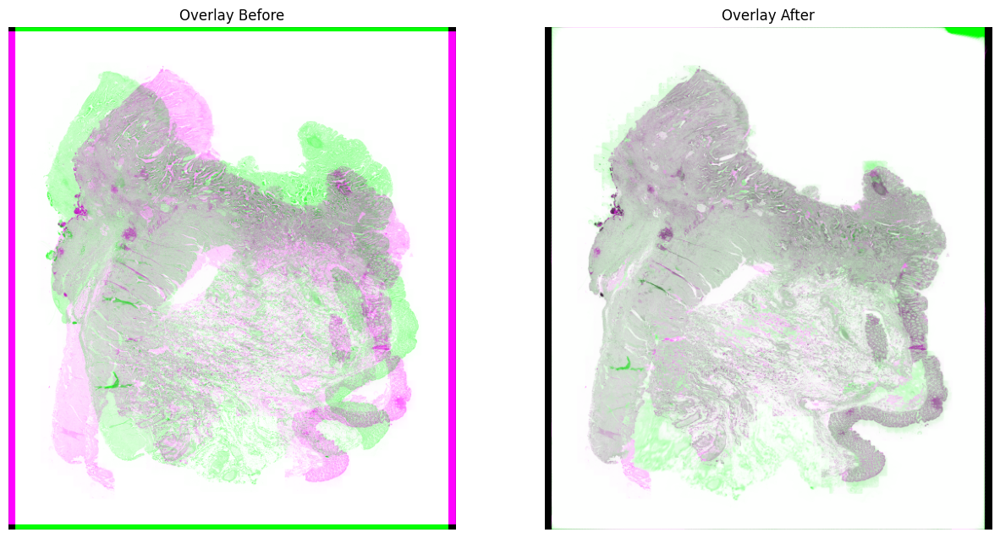

In [8]:
u_x, u_y = util.rigid_dot(source_prep,np.linalg.inv(final_transform))
deformation_field = np.stack(( u_x, u_y), axis=-1)
sitk_image = sitk.GetImageFromArray(deformation_field)


def tensor_to_rgb_numpy(tensor):
    # (1, 1, H, W) -> (3, H, W) -> (H, W, 3)
    tensor_rgb = tensor.squeeze().repeat(3, 1, 1)
    return tensor_rgb.permute(1, 2, 0).detach().cpu().numpy()

# coarse nonrigid

displacement_field,warped_source= elastic_image_registration(
   moving_img_transformed,
   target_prep,
   #  similarity_metric_params={'win_size': 7}, 
     compute_device='cuda'  # Use the same device
)
print("non rigid displacement field",displacement_field.shape)

visualize_overlays(target_prep, source_prep,     tensor_to_rgb_numpy(warped_source))




In [9]:
# deformation_field=util.create_displacement_field_for_wsi(final_transform, source, target)

# sitk.WriteImage(sitk_image, '/home/u5552013/Nextcloud/hyreco_vis/overlays/533_rigid.mha')

disp_field_np=util.tc_df_to_np_df(displacement_field)
w_x,w_y=util.compose_vector_fields(u_x, u_y, disp_field_np[0], disp_field_np[1])

deformation_field = np.stack(( w_x, w_y), axis=-1)
sitk_image = sitk.GetImageFromArray(deformation_field)
sitk.WriteImage(sitk_image, './anhir.mha')

u_x shape:  (608, 541)


## 6. TIAViz Registration Visualization 

In [ ]:
%%bash 
export BOKEH_ALLOW_WS_ORIGIN=localhost:5007

tiatoolbox visualize --slides "path-to-slides" --overlays "path-to-overlays"


## 7. Patch Visualization

In [11]:
# Scale transformation for high resolution analysis
transform_40x = scale_transformation_matrix(
    final_transform, PREPROCESSING_RESOLUTION, REGISTRATION_RESOLUTION
)

# Extract patches from target WSI
print("\nExtracting patches...")
fixed_patch_extractor = extract_patches_from_wsi(
    target_wsi, target_mask, PATCH_SIZE, PATCH_STRIDE
)

print(f"Total patches extracted: {len(fixed_patch_extractor)}")


Extracting patches...
Total patches extracted: 69


Coarse Rigid  Visualization

|2025-07-10|12:21:39.266| [WARNING] Read: Scale > 1.This means that the desired resolution is higher than the WSI baseline (maximum encoded resolution). Interpolation of read regions may occur.


Visualizing patch 30 at location (6000, 6000)


|2025-07-10|12:21:39.833| [WARNING] Read: Scale > 1.This means that the desired resolution is higher than the WSI baseline (maximum encoded resolution). Interpolation of read regions may occur.


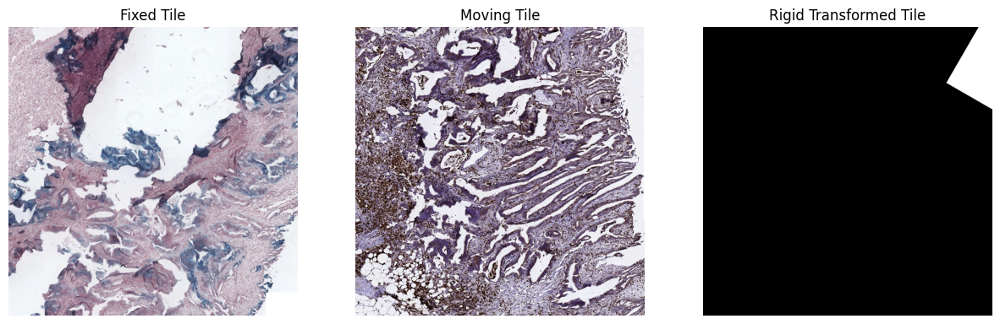

In [13]:
# Select a patch for visualization
patch_idx = 30  # You can change this index
loc = fixed_patch_extractor.coordinate_list[patch_idx]
location = (loc[0], loc[1])

print(f"Visualizing patch {patch_idx} at location {location}")

# Extract regions for comparison
fixed_tile = target_wsi.read_rect(location, VISUALIZATION_SIZE, resolution=40, units="power")
moving_tile = source_wsi.read_rect(location, VISUALIZATION_SIZE, resolution=40, units="power")

# Create transformer and extract transformed tile
tfm = AffineWSITransformer(source_wsi, transform_40x)
transformed_tile = tfm.read_rect(location=location, size=VISUALIZATION_SIZE, resolution=0, units="level")

# Visualize patches
visualize_patches(fixed_tile, moving_tile, transformed_tile)

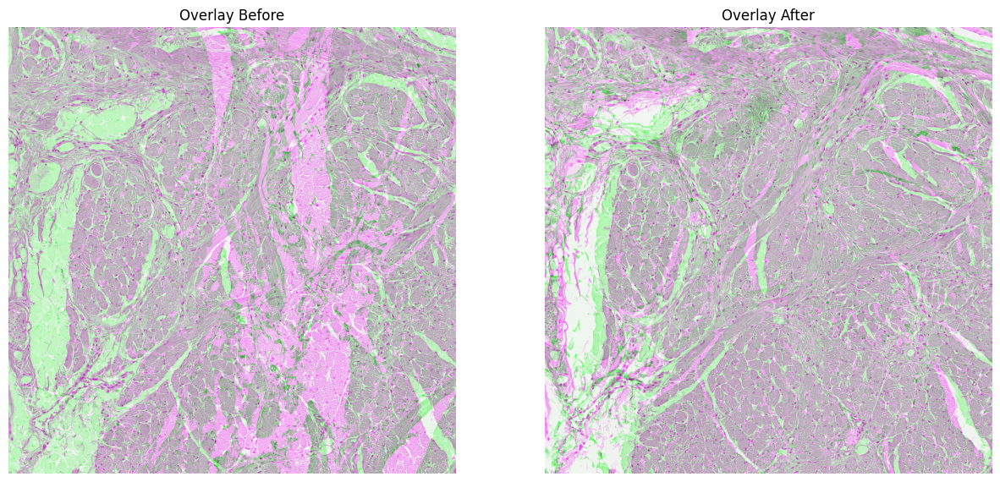

In [12]:
visualize_overlays(fixed_tile, moving_tile, transformed_tile)

NonRigid  Visualization

In [14]:
from tiatoolbox.wsicore.wsireader import TransformedWSIReader
from pathlib import Path
# Select a patch for visualization
patch_idx = 30  # You can change this index
loc = fixed_patch_extractor.coordinate_list[patch_idx]
location = (loc[0], loc[1])

print(f"Visualizing patch {patch_idx} at location {location}")

# Extract regions for comparison
fixed_tile = target_wsi.read_rect(location, size=(5000, 5000), resolution=40, units="power")
moving_tile = source_wsi.read_rect(location, size=(5000, 5000), resolution=40, units="power")

transformed_wsi = TransformedWSIReader(input_img=SOURCE_WSI_PATH, target_img=TARGET_WSI_PATH,  transform=Path('./anhir.mha'))
transformed_tile = transformed_wsi.read_rect( location,   size= (5000, 5000),  resolution=40,    units="power" )

# Visualize patches
visualize_patches(fixed_tile, moving_tile, transformed_tile)

|2025-07-10|12:21:58.481| [WARNING] Read: Scale > 1.This means that the desired resolution is higher than the WSI baseline (maximum encoded resolution). Interpolation of read regions may occur.


Visualizing patch 30 at location (6000, 6000)


|2025-07-10|12:21:59.015| [WARNING] Read: Scale > 1.This means that the desired resolution is higher than the WSI baseline (maximum encoded resolution). Interpolation of read regions may occur.
|2025-07-10|12:21:59.735| [ERROR] File does not have a .json extension.
|2025-07-10|12:22:02.066| [ERROR] File does not have a .json extension.
|2025-07-10|12:22:04.110| [WARNING] Raw data is None.
|2025-07-10|12:22:04.110| [WARNING] Unknown scale (no objective_power or mpp)
|2025-07-10|12:22:04.111| [WARNING] Raw data is None.
|2025-07-10|12:22:04.111| [WARNING] Unknown scale (no objective_power or mpp)
|2025-07-10|12:22:04.132| [WARNING] The image mode is set to 'feature' as the input dimensions do not match with binary mask or RGB/RGBA.


ValueError: ('Objective power is None. Cannot determine scale in terms of objective power.',)

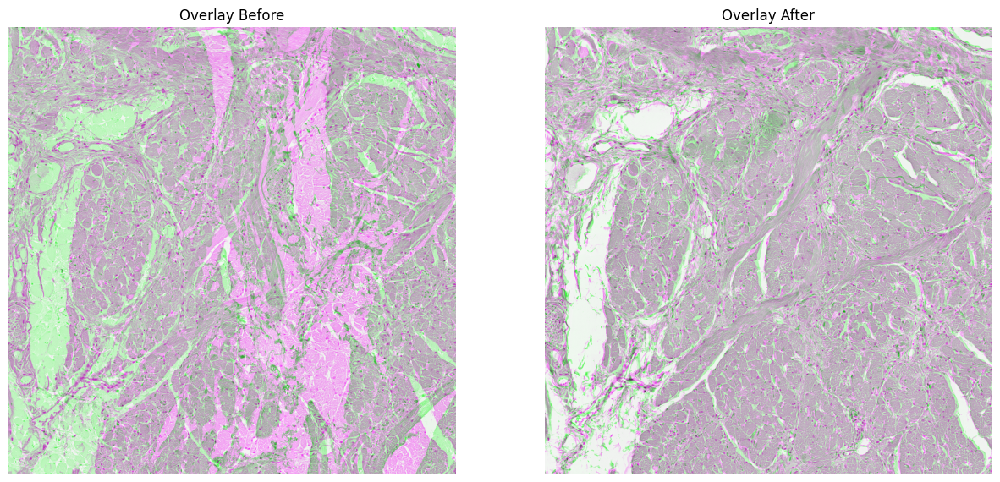

In [14]:
visualize_overlays(fixed_tile, moving_tile, transformed_tile)

## 8. Nuclei Detection and Analysis

In [ ]:
tmp_dir="path-to-save nuclei-detections"
FIXED_NUCLEI_CSV = os.path.join(tmp_dir, "fixed_nuclei.csv")
MOVING_NUCLEI_CSV = os.path.join(tmp_dir, "moving_nuclei.csv")

In [ ]:
import os

# Define tmp directory and CSV paths
tmp_dir = os.path.join(os.getcwd(), "tmp")
os.makedirs(tmp_dir, exist_ok=True)

FIXED_NUCLEI_CSV = os.path.join(tmp_dir, "fixed_nuclei.csv")
MOVING_NUCLEI_CSV = os.path.join(tmp_dir, "moving_nuclei.csv")

# Process nuclei detection on all patches
print("Processing nuclei detection on all patches...")
print("This may take several minutes depending on the number of patches...")
print("\n💡 Based on the validation above, the detection parameters look good!")

# Process a subset of patches for demonstration (adjust range as needed)
start_idx = 0
end_idx = max(50, len(fixed_patch_extractor) - 1)  # Process first 50 patches

print(f"Processing patches {start_idx} to {end_idx} ({end_idx-start_idx+1} patches)")
print("For full analysis, set end_idx = len(fixed_patch_extractor) - 1")

all_fixed_nuclei_data, all_moving_nuclei_data = process_nuclei_in_patches(
    fixed_patch_extractor, tfm, start_idx, end_idx
)

print(f"\n🔬 Nuclei Detection Results:")
print(f"- Fixed nuclei detected: {len(all_fixed_nuclei_data)}")
print(f"- Moving nuclei detected: {len(all_moving_nuclei_data)}")
print(f"- Average nuclei per patch:")
print(f"  * Fixed: {len(all_fixed_nuclei_data)/(end_idx-start_idx+1):.1f}")
print(f"  * Moving: {len(all_moving_nuclei_data)/(end_idx-start_idx+1):.1f}")

# Save nuclei data into tmp/
save_nuclei_data_to_csv(
    all_fixed_nuclei_data, all_moving_nuclei_data,
    FIXED_NUCLEI_CSV, MOVING_NUCLEI_CSV
)

print(f"\n✅ Nuclei CSVs saved:")
print(f"- Fixed nuclei: {FIXED_NUCLEI_CSV}")
print(f"- Moving nuclei: {MOVING_NUCLEI_CSV}")

## 9. Interactive Nuclei Visualization

In [12]:
# Load nuclei coordinates
moving_df = load_nuclei_coordinates(MOVING_NUCLEI_CSV)
fixed_df = load_nuclei_coordinates(FIXED_NUCLEI_CSV)

print(f"Loaded nuclei data:")
print(f"- Fixed nuclei: {len(fixed_df)}")
print(f"- Moving nuclei: {len(moving_df)}")

# Create basic nuclei overlay plot
print("\nCreating interactive nuclei overlay plot...")
plot1 = create_nuclei_overlay_plot(moving_df, fixed_df, 
                                  "Original Nuclei Coordinates (Before Registration)")
show_plot(plot1)

|2025-07-10|12:34:54.624| [WARNING] BokehDeprecationWarning: 'triangle() method' was deprecated in Bokeh 3.4.0 and will be removed, use "scatter(marker='triangle', ...) instead" instead.

|2025-07-10|12:34:54.626| [WARNING] BokehDeprecationWarning: 'circle() method with size value' was deprecated in Bokeh 3.4.0 and will be removed, use 'scatter(size=...) instead' instead.



Loaded nuclei data:
- Fixed nuclei: 13577
- Moving nuclei: 19473

Creating interactive nuclei overlay plot...


Applying coarse transform on Nuclei Points

u_x shape:  (608, 541)
deformation shape (2, 608, 541)
height 608
width 541


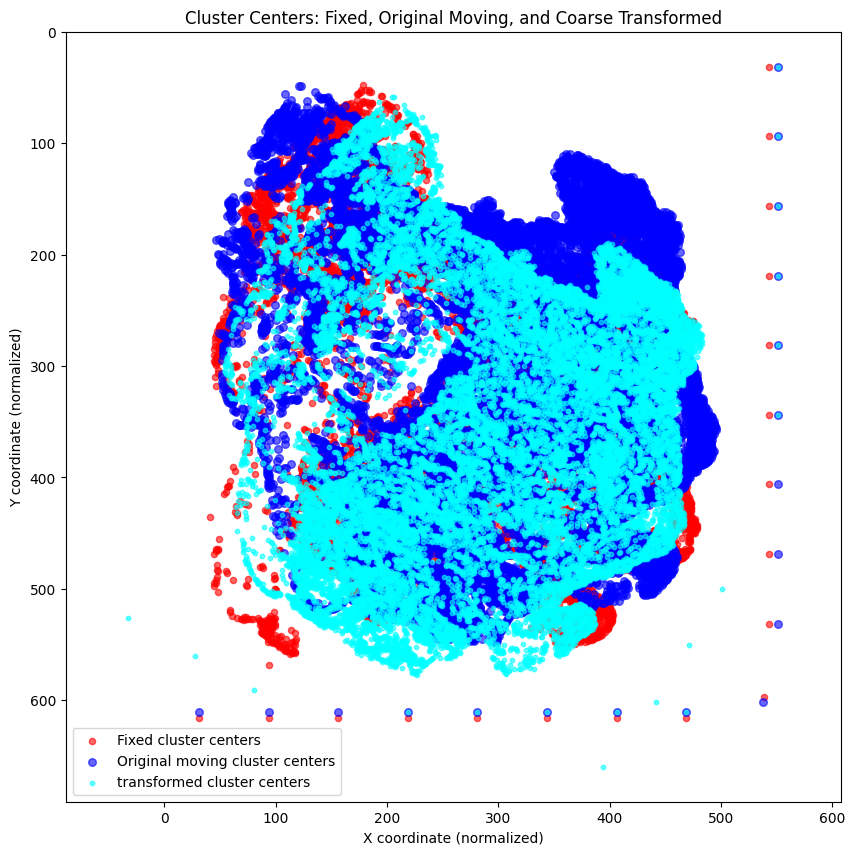

In [13]:
i_x, i_y = util.rigid_dot(source_prep, final_transform)
# Convert displacement field and compose transformations
disp_field_np = util.tc_df_to_np_df(displacement_field)
r_x, r_y = util.compose_vector_fields(i_x, i_y, disp_field_np[0], disp_field_np[1])
deformation_field = np.stack((r_x, r_y), axis=0)

print("deformation shape", deformation_field.shape)
moving_points = moving_df[['global_x', 'global_y']].values/16
fixed_points = fixed_df[['global_x', 'global_y']].values/16
# moving_points, fixed_points=pad_landmarks(padding_params, moving_points, fixed_points)
# Unpack padding
moving_updated = util.apply_deformation_to_points(moving_points, deformation_field)
# fixed_points=fixed_points*8
# moving_points=moving_points*8
# moving_updated=moving_updated*8

fixed_df[['global_x', 'global_y']] = fixed_points
moving_df[['global_x', 'global_y']] = moving_updated

plt.figure(figsize=(10, 10))
# Plot fixed cluster centers
plt.scatter(fixed_points[:, 0], fixed_points[:, 1],
                c='red', s=20, alpha=0.6, label='Fixed cluster centers')
# Plot original moving cluster centers
plt.scatter(moving_points[:, 0], moving_points[:, 1],
                c='blue', s=30, alpha=0.6, label='Original moving cluster centers')
# Plot CPD non-rigid transformed centers
plt.scatter(moving_updated[:, 0], moving_updated[:, 1],
                c='cyan', s=10, alpha=0.6, label='transformed cluster centers')
# Formatting
plt.legend()
plt.title('Cluster Centers: Fixed, Original Moving, and Coarse Transformed')
plt.xlabel('X coordinate (normalized)')
plt.ylabel('Y coordinate (normalized)')
plt.axis('equal')
plt.gca().invert_yaxis()
plt.show()  # Close the plot to free memory


## 10. Shape-Aware Point Set Registration

In [ ]:
# Perform shape-aware registration as an alternative to ICP
print("Performing Shape-Aware Point Set Registration...")

#  No of subsampling points can be adjusted
fixed_subsample =util.skip_subsample(fixed_df, n_samples=3000)
moving_subsample = util.skip_subsample(moving_df, n_samples=3000)

#  fine pointset registration
shape_registrator,shape_transform, shape_transformed_coords   = perform_shape_aware_registration(
    fixed_subsample,moving_subsample,
    shape_attribute='area',
    shape_weight=0.3,  # 30% weight for shape, 70% for spatial distance
    max_iterations=100,
    tolerance=1e-11
)


Performing Shape-Aware Point Set Registration...


In [14]:
# #  icp registration
transformation, transformed_points=perform_icp_registration( moving_updated,fixed_points,threshold=5000000)
T_sub = np.delete(np.delete(transformation, 2, axis=0), 2, axis=1)


ICP Transformation Matrix:
[[ 9.99821372e-01 -1.89003786e-02  0.00000000e+00 -1.17221868e+00]
 [ 1.89003786e-02  9.99821372e-01  0.00000000e+00 -2.69473254e+01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


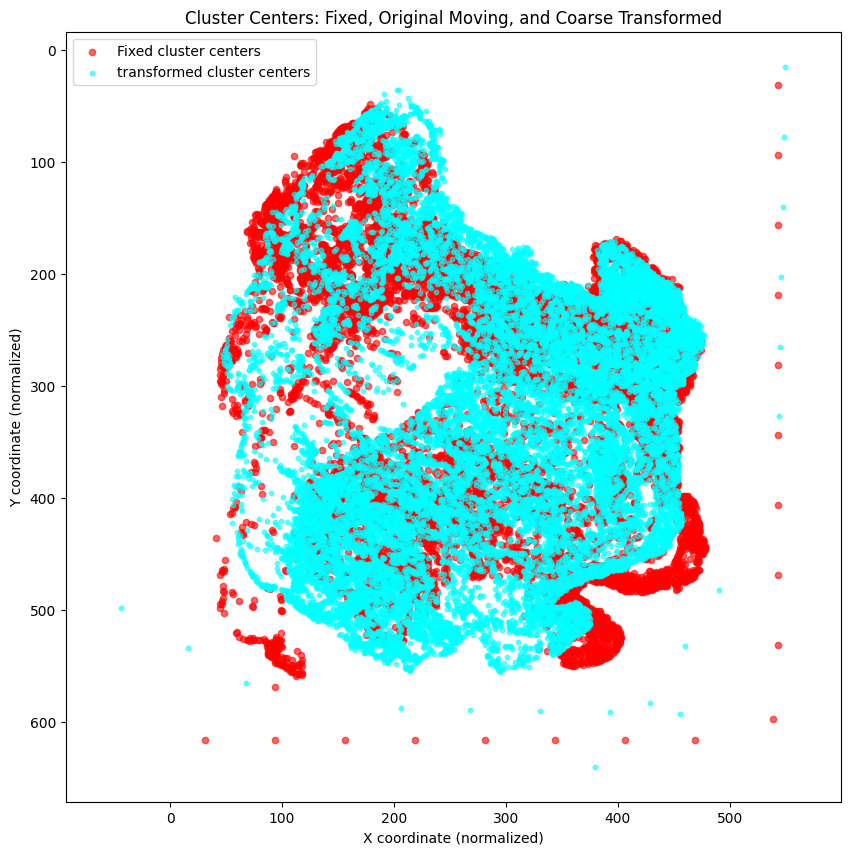

In [16]:
plt.figure(figsize=(10, 10))
# Plot fixed cluster centers
plt.scatter(fixed_points[:, 0], fixed_points[:, 1],
                c='red', s=20, alpha=0.6, label='Fixed cluster centers')
# Plot original moving cluster centers
# plt.scatter(moving_points[:, 0], moving_points[:, 1],
#                 c='blue', s=30, alpha=0.6, label='Original moving cluster centers')
# # Plot CPD non-rigid transformed centers
plt.scatter(transformed_points[:, 0], transformed_points[:, 1],
                c='cyan', s=10, alpha=0.6, label='transformed cluster centers')
# Formatting
plt.legend()
plt.title('Cluster Centers: Fixed, Original Moving, and Coarse Transformed')
plt.xlabel('X coordinate (normalized)')
plt.ylabel('Y coordinate (normalized)')
plt.axis('equal')
plt.gca().invert_yaxis()
plt.show()  # Close the plot to free memory


In [ ]:
moving_points=moving_subsample[['global_x','global_y']].values

In [18]:
#  No of subsampling points can be adjusted
fixed_subsample =util.skip_subsample(fixed_df, n_samples=3000)
moving_subsample = util.skip_subsample(moving_df, n_samples=3000)

In [ ]:


# print("3x3 matrix with 3rd row and column excluded:\n", T_sub)

# moving_df_shape_aware = create_nuclei_dataframe_from_points(shape_transformed_coords)
# moving_df_shape_aware = moving_df.copy()
# moving_df_shape_aware['global_x'] = shape_transformed_coords[:, 0]
# moving_df_shape_aware['global_y'] = shape_transformed_coords[:, 1]

print("✅ Shape-aware registration completed!")


# Non-rigid CPD
X = fixed_subsample[['global_x', 'global_y']].values

Y = moving_subsample[['global_x','global_y']].values
print('Non-rigid CPD:')
cpd_nonrigid = CPD(method='nonrigid')
nonrigid_transformed_coords , P = cpd_nonrigid(X, Y, w=0, max_iterations=50)
print(f'Non-rigid alignment: {np.argmax(P, axis=1)}\n')


✅ Shape-aware registration completed!
Non-rigid CPD:


In [32]:
# translation_matrix, rotation_scale_matrix
scale_factor = 0.625 / 40  # 0.25
transform_3x3_scaled = T_sub.copy()
# transform_3x3_scaled=shape_transform
transform_3x3_scaled[0:2, 2] = transform_3x3_scaled[0:2, 2] * scale_factor
sh_transform=transform_3x3_scaled
t_x, t_y = util.rigid_dot(source_prep,np.linalg.inv(sh_transform))
f_x,f_y=util.compose_vector_fields( u_x,u_y,t_x,t_y)

deformation_field = np.stack(( f_x, f_y), axis=-1)
sitk_image = sitk.GetImageFromArray(deformation_field)
sitk.WriteImage(sitk_image, './533_finerigid.mha')



u_x shape:  (3451, 1520)


Visualizing patch 70 at location (59000, 78000)


|2025-07-10|11:56:08.708| [ERROR] File does not have a .json extension.
|2025-07-10|11:56:09.135| [ERROR] File does not have a .json extension.
|2025-07-10|11:56:09.603| [WARNING] Metadata: Objective power inferred from microns-per-pixel (MPP).
|2025-07-10|11:56:09.604| [WARNING] Metadata: Objective power inferred from microns-per-pixel (MPP).
|2025-07-10|11:56:09.800| [WARNING] The image mode is set to 'feature' as the input dimensions do not match with binary mask or RGB/RGBA.


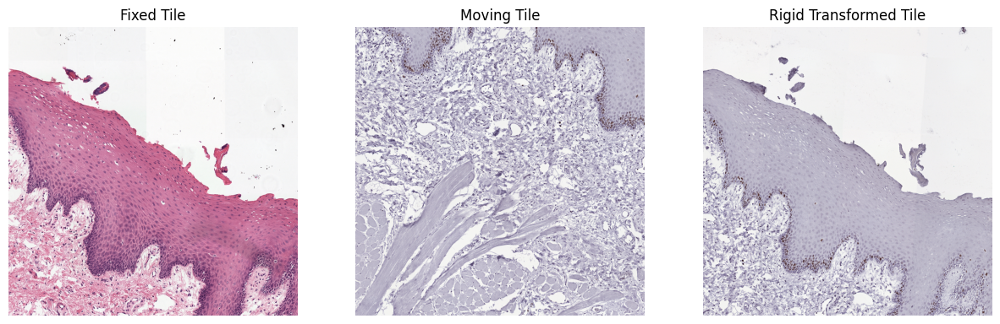

In [33]:
from tiatoolbox.wsicore.wsireader import TransformedWSIReader
from pathlib import Path
# Select a patch for visualization
patch_idx = 70  # You can change this index
loc = fixed_patch_extractor.coordinate_list[patch_idx]
location = (loc[0], loc[1])

print(f"Visualizing patch {patch_idx} at location {location}")

# Extract regions for comparison
fixed_tile = target_wsi.read_rect(location, size=(5000, 5000), resolution=40, units="power")
moving_tile = source_wsi.read_rect(location, size=(5000, 5000), resolution=40, units="power")

transformed_wsi = TransformedWSIReader(input_img=SOURCE_WSI_PATH, target_img=TARGET_WSI_PATH,  transform=Path('./533_finerigid.mha'))
transformed_tile = transformed_wsi.read_rect( location,   size= (5000, 5000),  resolution=40,    units="power" )

# Visualize patches
visualize_patches(fixed_tile, moving_tile, transformed_tile)

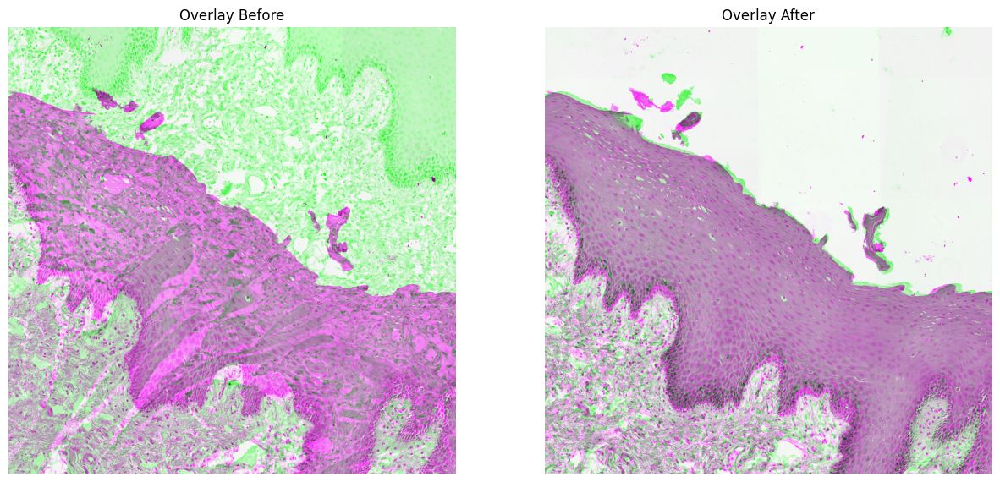

In [34]:
visualize_overlays(fixed_tile, moving_tile, transformed_tile)

In [43]:
from scipy.ndimage import map_coordinates
import numpy as np
import pandas as pd

# Create displacement field for spatial transformation analysis
print("Creating displacement field...")

# Scale down coordinates for field generation
scale_factor = 64
source_points_scaled = moving_points  / scale_factor
target_points_scaled =nonrigid_transformed_coords / scale_factor

displacement_field = create_displacement_field(
    source_points_scaled, target_points_scaled,
    target_prep.shape,
    method=RegistrationParams.INTERPOLATION_METHOD,
    sigma=RegistrationParams.DISPLACEMENT_SIGMA,
    max_displacement=RegistrationParams.MAX_DISPLACEMENT
)
fr_x,fr_y=util.compose_vector_fields(w_x, w_y, displacement_field[..., 0],displacement_field[..., 1])

deformation_field = np.stack(( fr_x, fr_y), axis=-1)
sitk_image = sitk.GetImageFromArray(deformation_field)
sitk.WriteImage(sitk_image, './533_nonrigid.mha')


Creating displacement field...
u_x shape:  (3451, 1520)


Visualizing patch 70 at location (59000, 78000)


|2025-07-10|12:03:31.474| [ERROR] File does not have a .json extension.
|2025-07-10|12:03:31.913| [ERROR] File does not have a .json extension.
|2025-07-10|12:03:32.385| [WARNING] Metadata: Objective power inferred from microns-per-pixel (MPP).
|2025-07-10|12:03:32.386| [WARNING] Metadata: Objective power inferred from microns-per-pixel (MPP).
|2025-07-10|12:03:32.579| [WARNING] The image mode is set to 'feature' as the input dimensions do not match with binary mask or RGB/RGBA.


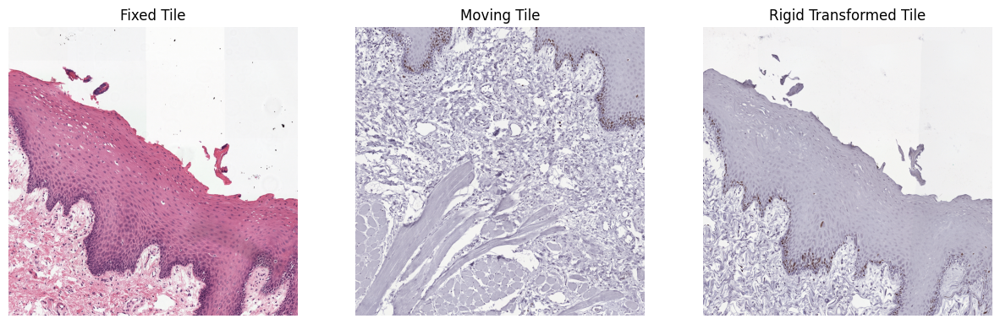

In [46]:
from tiatoolbox.wsicore.wsireader import TransformedWSIReader
from pathlib import Path
# Select a patch for visualization
patch_idx = 70  # You can change this index
loc = fixed_patch_extractor.coordinate_list[patch_idx]
location = (loc[0], loc[1])

print(f"Visualizing patch {patch_idx} at location {location}")

# Extract regions for comparison
fixed_tile = target_wsi.read_rect(location, size=(5000, 5000), resolution=40, units="power")
moving_tile = source_wsi.read_rect(location, size=(5000, 5000), resolution=40, units="power")

transformed_wsi = TransformedWSIReader(input_img=SOURCE_WSI_PATH, target_img=TARGET_WSI_PATH,  transform=Path('./533_nonrigid.mha'))
transformed_tile = transformed_wsi.read_rect( location,   size= (5000, 5000),  resolution=40,    units="power" )

# Visualize patches
visualize_patches(fixed_tile, moving_tile, transformed_tile)

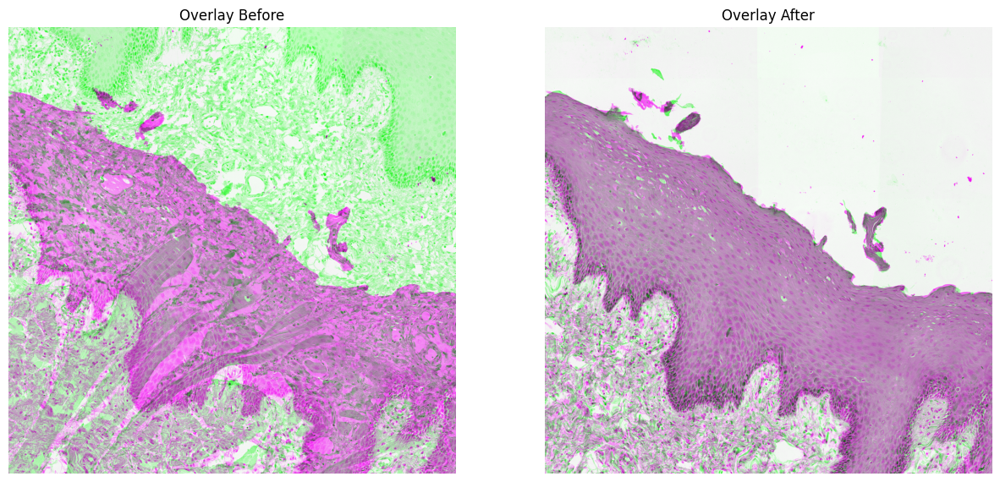

In [47]:
visualize_overlays(fixed_tile,moving_tile, transformed_tile)

## 11. TIAViz Registration Visualization

In [ ]:
%%bash 
export BOKEH_ALLOW_WS_ORIGIN=localhost:5007

tiatoolbox visualize --slides "path-to-slides" --overlays "path-to-overlays"
